In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.diagnostic import linear_harvey_collier, het_breuschpagan
from scipy import stats
import math
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler,TargetEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import xgboost as xgb

In [ ]:
df=pd.read_csv("AR_dataset_v1.csv")
df.head()

,Player,Tm,Salary,Pos,Age,G,GS,MP,FG,FGA,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,Stephen Curry,GSW,51915615.0,PG,34,56,56,1941,559,1133,...,0.915,39,302,341,352,52,20,179,117,1648
1,Kevin Durant,PHO,47649433.0,PF,34,8,8,269,73,128,...,0.833,3,48,51,28,2,10,20,7,208
2,Nikola Jokić,DEN,47607350.0,C,27,69,69,2323,646,1022,...,0.822,167,650,817,678,87,47,247,174,1690
3,Joel Embiid,PHI,47607350.0,C,28,66,66,2284,728,1328,...,0.857,113,557,670,274,66,112,226,205,2183
4,LeBron James,LAL,47607350.0,PF,38,55,54,1954,609,1219,...,0.768,65,392,457,375,50,32,178,88,1590


In [ ]:
df.columns[df.isnull().sum()!=0]
# As FT% is calculated from FG and it was calculated by FG/Total

Index(['3P%', '2P%', 'FT%'], dtype='object')

In [ ]:
df.fillna(0,inplace=True)
df.isnull().sum().to_frame().T

,Player,Tm,Salary,Pos,Age,G,GS,MP,FG,FGA,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("Salary Distribution", "Salary Box Plot"))

fig.add_trace(
    go.Histogram(x=df['Salary'],
                 nbinsx=50,
                 name="Salary"),
    row=1, col=1)

fig.add_trace(
    go.Box(y=df['Salary'],
           name="Salary"),
    row=1, col=2)

fig.update_layout(
    template='simple_white',
    showlegend=False,
    title_text="NBA Player Salary Distribution",
    title_x=0.5)

fig.update_yaxes(title_text="Number of Players", row=1, col=1)
fig.update_yaxes(title_text="Salary ($)", row=1, col=2)
fig.update_xaxes(title_text="Salary ($)", row=1, col=1)

fig.show()

In [ ]:
df.columns

Index(['Player', 'Tm', 'Salary', 'Pos', 'Age', 'G', 'GS', 'MP', 'FG', 'FGA',
       'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA',
       'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [ ]:
data_type_counts = df.dtypes.value_counts()
data_type_counts

,count
int64,21
float64,6
object,3


Player, Team, Position were only object data types. And out of these player name is not a useful metric. As i doesnt mean anything to salary


And for the categorical variables most likely we should use target encoding
Instead of using Label Encoder or One Hot Encoder, I think salary might depend on Teams in few cases, Teams like A would pay higher salary, etc.

In [ ]:
# For parametric test (ANOVA)

f_statistic, p_value = stats.f_oneway(*[group['Salary'] for name, group in df.groupby('Tm')])
p_value

# This means that we dont have enough evidence to make a prove the claim that there is no difference between
# salary and team [Team has not effect on salary], we fail to reject null hypothesis.
# This doesnt mean there is no relationship between 2, its just that we dont have enough evidence to prove there is a difference.
# We dont have enough evidence to conclude there is a relationship between team and salary
# The differences we observe in salaries between teams could be due to random choices.
# Not finding enough evidence to convict someone doesnt prove they're innocent. It just means that we dont have enough evidence to prove
# guilt beyond reasonable doubt.


# Even though its not statistically significant, it can be still have predictable importance.
# We dont drop variables based on significance.

0.5709037954369214

<Axes: xlabel='Tm', ylabel='Salary'>

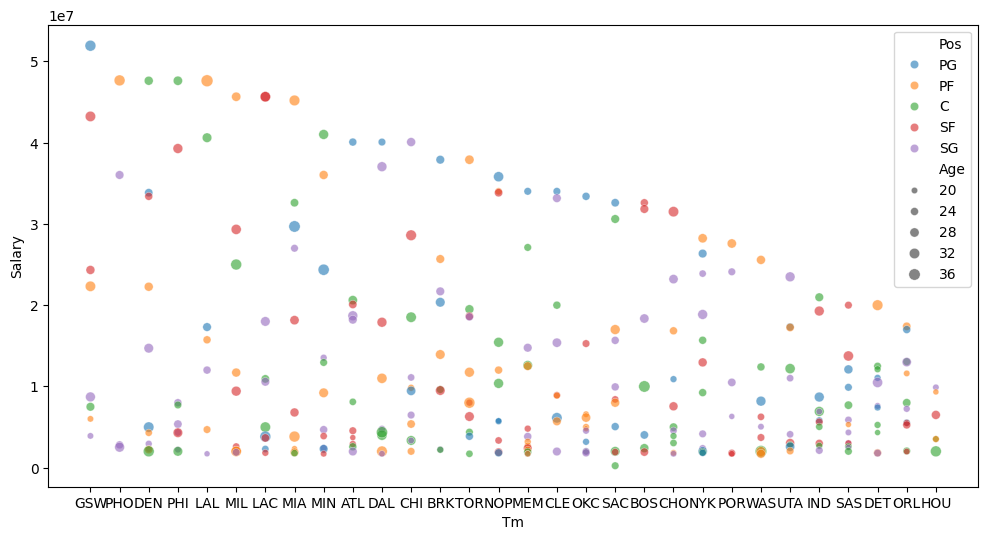

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df,x='Tm',y='Salary',size='Age',hue='Pos',alpha=0.6)

In [ ]:
from scipy import stats
f_statistic, p_value = stats.f_oneway(*[group['Salary'] for name, group in df.groupby('Pos')])
p_value

# If my p value was <0.05 , it is clear that we have enough evidence to reject the null [No relationship between salary and position]
# So we are rejecting null here and say there is a relationship between salary and position. Different positions have different salary distribution
# So for damn sure we keep this in the model
# But here the p value is 0.16, and this doesnt make us to remove it model, it just says we dont have enough proof to reject null[unable to reject this there is no relation between 2 variables].

0.1638963981302317

In [ ]:
# 7.53*1000000

In [ ]:
df.describe().T
# From this its clear that all the variables are of different scale, so we have to choose one of the feature scaling techniques
# But this can be done later, as we need to apply feature encoding before scaling so we will set these steps in the next steps

,count,mean,std,min,25%,50%,75%,max
Salary,294.0,1.230298e+07,1.212473e+07,250000.0,3.045624e+06,7.530000e+06,1.797443e+07,51915615.00
Age,294.0,2.521088e+01,4.185513e+00,19.0,2.200000e+01,2.400000e+01,2.800000e+01,38.00
G,294.0,5.331633e+01,2.220488e+01,1.0,3.625000e+01,6.000000e+01,7.200000e+01,82.00
GS,294.0,3.093197e+01,2.842622e+01,0.0,4.000000e+00,2.100000e+01,6.200000e+01,82.00
MP,294.0,1.344643e+03,7.982703e+02,2.0,6.495000e+02,1.303500e+03,2.070500e+03,2842.00
FG,294.0,2.467959e+02,1.883755e+02,0.0,8.700000e+01,2.000000e+02,3.777500e+02,728.00
FGA,294.0,5.103333e+02,3.887541e+02,1.0,1.962500e+02,4.170000e+02,7.955000e+02,1559.00
FG%,294.0,4.842959e-01,9.090969e-02,0.0,4.330000e-01,4.730000e-01,5.240000e-01,0.90
3P,294.0,6.690816e+01,6.394282e+01,0.0,1.425000e+01,5.000000e+01,1.037500e+02,301.00
3PA,294.0,1.845408e+02,1.668365e+02,0.0,4.025000e+01,1.420000e+02,2.860000e+02,731.00


# Lets remove outliers from dataset

In [ ]:
Q1 = df['Salary'].quantile(0.25)
Q3 = df['Salary'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df_clean = df[(df['Salary'] >= lower_bound) & (df['Salary'] <= upper_bound)]

print(f"Original dataset size: {len(df)}")
print(f"Dataset size after removing outliers: {len(df_clean)}")
print(f"Number of outliers removed: {len(df) - len(df_clean)}")

print("\nSalary Statistics Before:")
print(df['Salary'].describe())
print("\nSalary Statistics After:")
print(df_clean['Salary'].describe())

Original dataset size: 294
Dataset size after removing outliers: 282
Number of outliers removed: 12

Salary Statistics Before:
count    2.940000e+02
mean     1.230298e+07
std      1.212473e+07
min      2.500000e+05
25%      3.045624e+06
50%      7.530000e+06
75%      1.797443e+07
max      5.191562e+07
Name: Salary, dtype: float64

Salary Statistics After:
count    2.820000e+02
mean     1.087860e+07
std      1.014985e+07
min      2.500000e+05
25%      2.961840e+06
50%      6.694995e+06
75%      1.572601e+07
max      4.006422e+07
Name: Salary, dtype: float64


In [ ]:
fig = px.scatter(df_clean,
                 x=df_clean['PTS']/df_clean['G'],
                 y='Salary',
                 title='Points per game vs Salary',
                 template='simple_white')

fig.add_traces(
    px.scatter(df_clean, x=df_clean['PTS']/df_clean['G'], y='Salary',
               trendline="lowess",
               trendline_color_override="red"
    ).data[1]
)

# Update layout
fig.update_layout(
    xaxis_title="Points per game",
    yaxis_title="Salary in 2023 (USD)",
    showlegend=False
)

# Format y-axis to show millions
fig.update_yaxes(
    ticktext=[f"{x/1e6}M" for x in range(0, 50000001, 10000000)],
    tickvals=list(range(0, 50000001, 10000000))
)

# Update marker properties
fig.update_traces(
    marker=dict(color='red', size=8),
    selector=dict(mode='markers')
)

fig.show()

In [ ]:
df_clean['G_bins'] = pd.cut(df_clean['G'],
                           bins=range(0, df_clean['G'].max() + 10, 10),
                           right=False)
print(df_clean['G_bins'].value_counts().sort_index())


G_bins
[0, 10)     14
[10, 20)    14
[20, 30)    32
[30, 40)    23
[40, 50)    19
[50, 60)    36
[60, 70)    60
[70, 80)    67
[80, 90)    17
Name: count, dtype: int64


<ipython-input-14-599695085657>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_clean.drop(['G_bins'],axis=1,inplace=True)

<ipython-input-15-82700a8a525d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



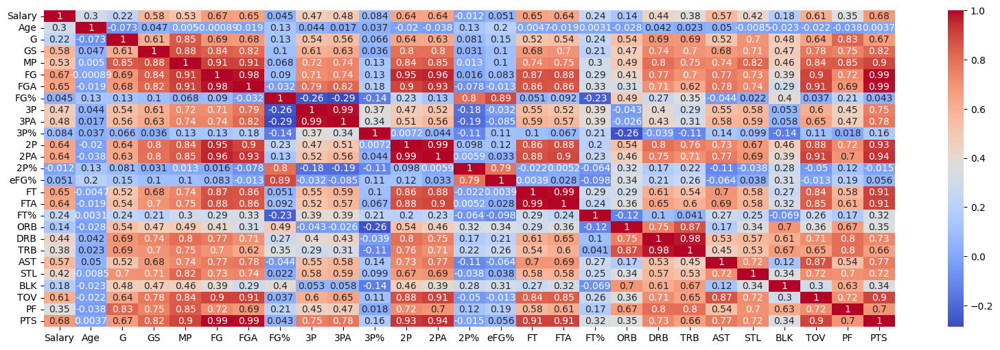

In [ ]:
plt.figure(figsize=(20, 6))
sns.heatmap(df_clean.drop(['Player','Tm',"Pos"],axis=1).corr(),annot=True,cmap='coolwarm')
plt.show()
# Its clear from the heat map, that variables like FG and FGA are showing a strong collinearity. Similary (3P, 3PA), (2P,2PA), (FT,FTA), (DRB,TRB)

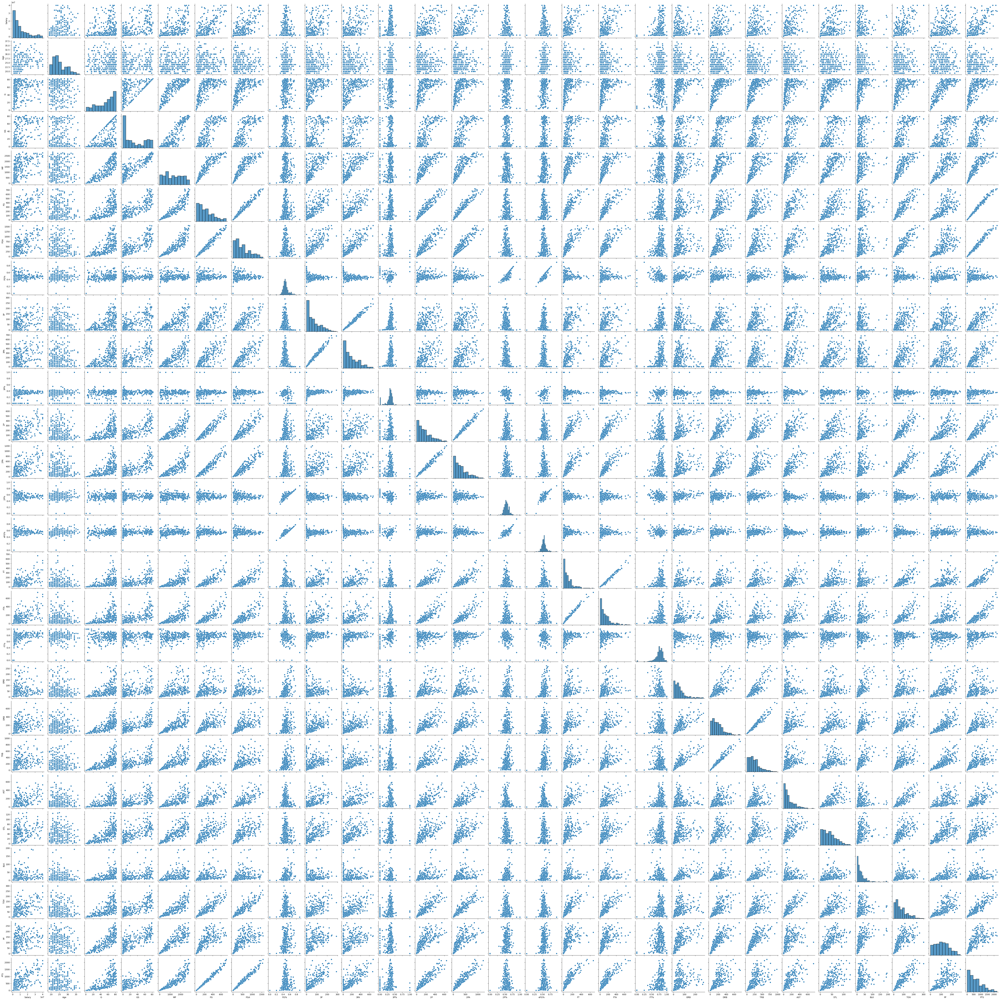

In [ ]:
sns.pairplot(df_clean.drop(['Player','Tm',"Pos"],axis=1))
plt.show()

In [ ]:
# Dealing with non linear relationships like, exponential etc
# Dont remove them from dataset. Instead apply feature transformations like log transformation[right skewed] , square root transformation [right skewed], Box Cox transformations [Can work for either left or right], exponential [left skewed],
# power transformations [cube or square] [left skewed]
# Box Cox can only be appplied to those datasets, where there will be no -ve values. Cases where you find the -ve values, we could use Yeo-Johnson transformation.
# I could apply 10 different transformation on 10 or 20 columns but in the end / post transformation. scale everything by the same method.

In [ ]:
# First let me splitting it into 2 parts
# We could then apply transformations on the dataset.
# And may be i could consider removing some of the columns in the dataset that shows high collinearity between variables not with response.


In [ ]:
features_to_remove = ['FGA', '2PA', '3PA','FTA','DRB','FG']
df_clean.drop(columns=features_to_remove,inplace=True)

<ipython-input-17-3f1cbca5b715>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



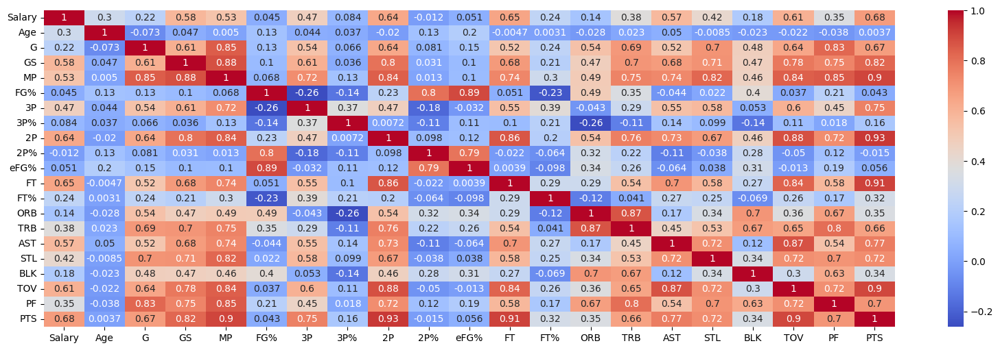

In [ ]:
plt.figure(figsize=(20, 6))
sns.heatmap(df_clean.drop(['Player','Tm',"Pos"],axis=1).corr(),annot=True,cmap='coolwarm')
plt.show()

In [ ]:
df_clean.drop(['Player'],axis=1,inplace=True)

<ipython-input-19-a64e2d809789>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:

# from sklearn.preprocessing import
X = df_clean.drop('Salary', axis=1)
y = df_clean['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

categorical_cols = ['Tm', 'Pos']  # Only team and position are categorical
numerical_cols = ['Age', 'G', 'GS', 'MP', 'FG%', '3P', '3P%', '2P',
       '2P%', 'eFG%', 'FT', 'FT%', 'ORB', 'TRB', 'AST', 'STL', 'BLK', 'TOV',
       'PF', 'PTS']


te = TargetEncoder(target_type='continuous')
X_train_cat_encoded = te.fit_transform(X_train[categorical_cols], y_train)


X_train_cat_encoded = pd.DataFrame(X_train_cat_encoded, columns=categorical_cols,index=X_train.index)
X_train_encoded = pd.concat([X_train_cat_encoded, X_train[numerical_cols]], axis=1)

X_test_cat_encoded = te.transform(X_test[categorical_cols])
X_test_cat_encoded = pd.DataFrame(X_test_cat_encoded,columns=categorical_cols, index=X_test.index)
X_test_encoded = pd.concat([X_test_cat_encoded, X_test[numerical_cols]], axis=1)

In [ ]:
X_train_encoded.columns

Index(['Tm', 'Pos', 'Age', 'G', 'GS', 'MP', 'FG%', '3P', '3P%', '2P', '2P%',
       'eFG%', 'FT', 'FT%', 'ORB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF',
       'PTS'],
      dtype='object')

In [ ]:
def adjusted_r2_score(y_true, y_pred, n, p):

    r2 = r2_score(y_true, y_pred)  # Calculate regular R²
    adjusted_r2 = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
    return adjusted_r2

In [ ]:
# 3. Feature transformations for different continuous columns
log_columns = ["3P" , "2P",  "FT",  "ORB",  "TRB", "AST", "BLK"]  # Right skewed too extreme
X_train_encoded[log_columns] = np.log1p(X_train_encoded[log_columns])
X_test_encoded[log_columns] = np.log1p(X_test_encoded[log_columns])


sqrt_columns = ['STL', 'TOV', 'PTS']  # moderately right skewed columns
X_train_encoded[sqrt_columns] = np.sqrt(X_train_encoded[sqrt_columns])
X_test_encoded[sqrt_columns] = np.sqrt(X_test_encoded[sqrt_columns])

# Cubic transformation (x³) left-skewed columns
expon_columns = ['G', 'FT%']
X_train_encoded[expon_columns] = X_train_encoded[expon_columns]**3
X_test_encoded[expon_columns] = X_test_encoded[expon_columns]**3


# 4. Scale features

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

# 5. Fit linear model

model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Evaluate model
y_pred=model.predict(X_test_scaled)
n = len(y_test)
p = X_test_scaled.shape[1]

adj_r2 = adjusted_r2_score(y_test, y_pred, n, p)

# y_pred = model.predict(X_test_scaled)
print(f"Adjusted R²: {adj_r2:.4f}")
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}')


Adjusted R²: 0.3305
RMSE: 6177860.483164122


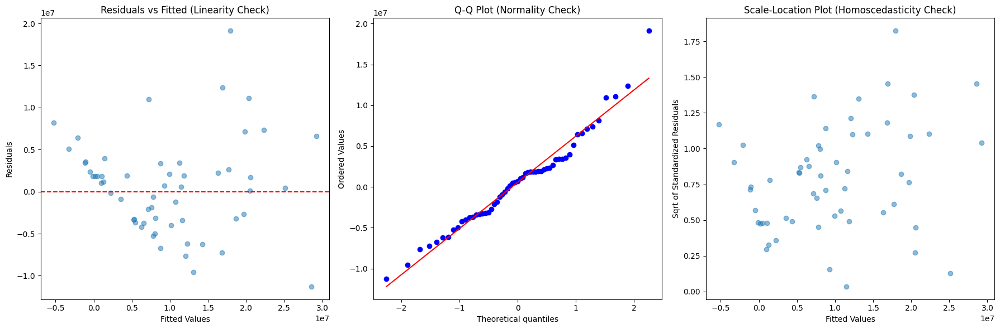

In [ ]:
# Calculate residuals
residuals = y_test - y_pred
fitted_values = y_pred

fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns

# 1. Linearity Check (Residuals vs Fitted)
axes[0].scatter(fitted_values, residuals, alpha=0.5)
axes[0].axhline(y=0, color='r', linestyle='--')
axes[0].set_xlabel("Fitted Values")
axes[0].set_ylabel("Residuals")
axes[0].set_title("Residuals vs Fitted (Linearity Check)")

# 2. Normality Check (Q-Q Plot)
stats.probplot(residuals, dist="norm", plot=axes[1])
axes[1].set_title("Q-Q Plot (Normality Check)")

# 3. Homoscedasticity Check (Scale-Location Plot)
axes[2].scatter(fitted_values, np.sqrt(np.abs(stats.zscore(residuals))), alpha=0.5)
axes[2].set_xlabel("Fitted Values")
axes[2].set_ylabel("Sqrt of Standardized Residuals")
axes[2].set_title("Scale-Location Plot (Homoscedasticity Check)")

# Adjust layout for better spacing
plt.tight_layout()

# Show plots
plt.show()


In [ ]:
import statsmodels.api as sm
import scipy.stats as stats
from statsmodels.stats.diagnostic import linear_harvey_collier, het_breuschpagan

# Fit OLS model
model = sm.OLS(y_test, sm.add_constant(X_test_scaled)).fit()
residuals = model.resid

print("=" * 60)
print(" 📌  STATISTICAL TESTS FOR MODEL ASSUMPTIONS")
print("=" * 60)

# 1. Linearity Test (Harvey-Collier)
hc_test = linear_harvey_collier(model)
print("\n🔹 Harvey-Collier Test for Linearity")
print(f"   ➤ t-statistic: {hc_test.statistic:.4f}")
print(f"   ➤ p-value: {hc_test.pvalue:.4f}")
if hc_test.pvalue < 0.0 or np.isnan(hc_test.pvalue):
    print("   ❌ Reject Null: The relationship is NOT linear.")
else:
    print("   ✅ Fail to Reject Null: The relationship is linear.")

print("-" * 60)

# 2. Normality Test (Shapiro-Wilk)
shapiro_stat, shapiro_p_value = stats.shapiro(residuals)
print("\n🔹 Shapiro-Wilk Test for Normality")
print(f"   ➤ W-statistic: {shapiro_stat:.4f}")
print(f"   ➤ p-value: {shapiro_p_value:.4f}")
if shapiro_p_value < 0.05 or np.isnan(shapiro_p_value):
    print("   ❌ Reject Null: Errors violate normality.")
else:
    print("   ✅ Fail to Reject Null: Errors are normally distributed.")

print("-" * 60)

# 3. Homoscedasticity Test (Breusch-Pagan)
lm_stat, lm_pvalue, fvalue, f_pvalue = het_breuschpagan(residuals, model.model.exog)
print("\n🔹 Breusch-Pagan Test for Homoscedasticity")
print(f"   ➤ Lagrange Multiplier Statistic: {lm_stat:.4f}")
print(f"   ➤ LM Test p-value: {lm_pvalue:.4f}")
print(f"   ➤ F-statistic: {fvalue:.4f}")
print(f"   ➤ F-test p-value: {f_pvalue:.4f}")
if lm_pvalue < 0.05:
    print("   ❌ Reject Null: Errors are heteroscedastic (variance is NOT constant).")
else:
    print("   ✅ Fail to Reject Null: Homoscedasticity is satisfied.")

print("=" * 60)

 📌  STATISTICAL TESTS FOR MODEL ASSUMPTIONS

🔹 Harvey-Collier Test for Linearity
   ➤ t-statistic: nan
   ➤ p-value: nan
   ❌ Reject Null: The relationship is NOT linear.
------------------------------------------------------------

🔹 Shapiro-Wilk Test for Normality
   ➤ W-statistic: 0.9864
   ➤ p-value: 0.7694
   ✅ Fail to Reject Null: Errors are normally distributed.
------------------------------------------------------------

🔹 Breusch-Pagan Test for Homoscedasticity
   ➤ Lagrange Multiplier Statistic: 20.0750
   ➤ LM Test p-value: 0.5783
   ➤ F-statistic: 0.8402
   ➤ F-test p-value: 0.6609
   ✅ Fail to Reject Null: Homoscedasticity is satisfied.


In [ ]:
# 5. VIF for Multicollinearity
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train_encoded.columns, index=X_train_encoded.index)
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Add constant and calculate VIF
X_with_constant = sm.add_constant(X_train_scaled_df)
vif_data = pd.DataFrame()
vif_data["Variable"] = X_with_constant.columns
vif_data["VIF"] = [variance_inflation_factor(X_with_constant.values, i)
                   for i in range(X_with_constant.shape[1])]
print("\nVariance Inflation Factors:")
print(vif_data)
# We see there is still problems with collinearity, so we would remove features whose VIF > 5,



Variance Inflation Factors:
   Variable        VIF
0     const   1.000000
1        Tm   1.191677
2       Pos   1.896678
3       Age   1.234615
4         G   7.940416
5        GS   8.080047
6        MP  53.361211
7       FG%  68.307028
8        3P  16.750698
9       3P%   2.241421
10       2P  57.539415
11      2P%   3.283908
12     eFG%  32.957462
13       FT  14.453037
14      FT%   2.013530
15      ORB  13.358143
16      TRB  28.169278
17      AST  12.646810
18      STL   5.966908
19      BLK   4.784031
20      TOV  16.210365
21       PF   6.942838
22      PTS  46.175261


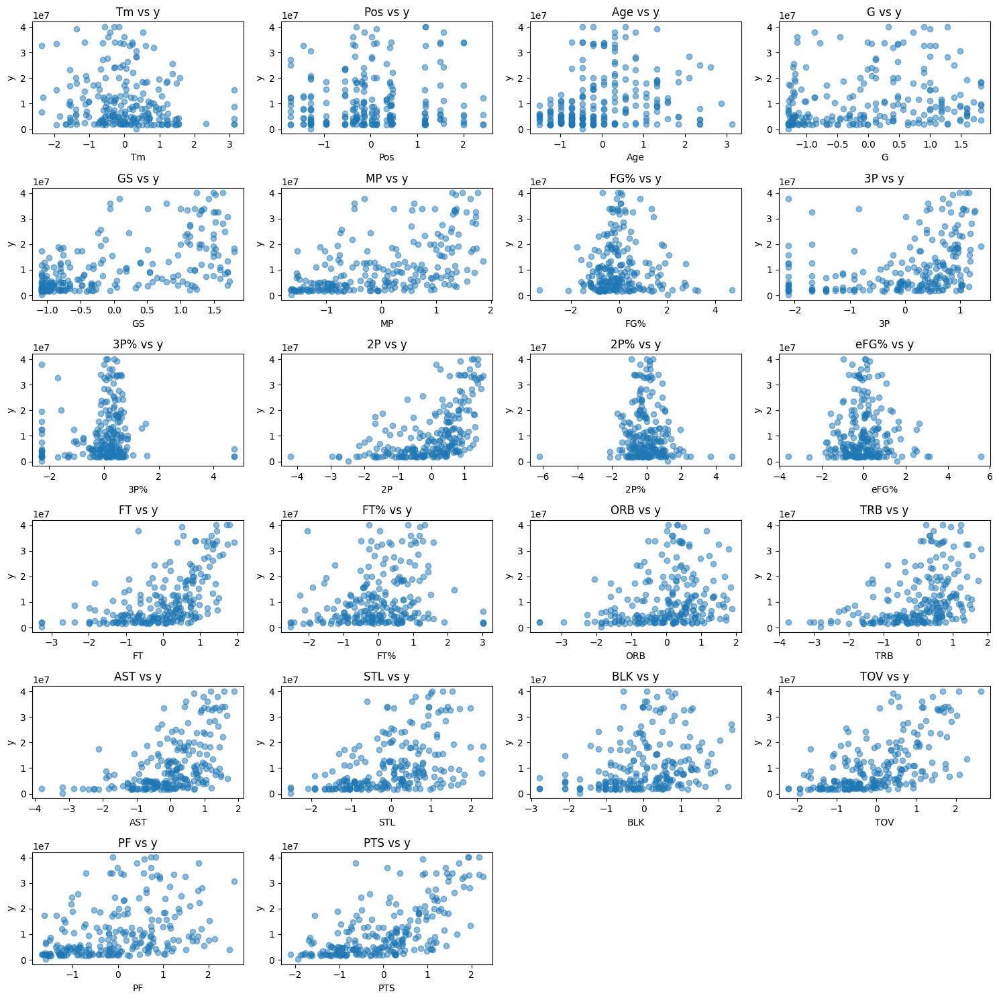

In [ ]:
X_train_scaled_df=pd.DataFrame(X_train_scaled)
X_train_scaled_df.columns=X_train_encoded.columns
# X_train_scaled_df
# Define the number of columns and rows
num_features = len(X_train_scaled_df.columns)
cols = 4  # 3 columns
rows = math.ceil(num_features / cols)  # Calculate required rows

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))  # Adjust figure size
axes = axes.flatten()  # Flatten the axes array for easy iteration

for i, col in enumerate(X_train_scaled_df.columns):
    axes[i].scatter(X_train_scaled_df[col], y_train, alpha=0.5)  # Add scatter plot
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Salary")
    axes[i].set_title(f"{col} vs Salary")

# Hide any unused subplots (in case the total number of features isn't a multiple of 3)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

    # MP, FG%, 3P, 2P, Ft, ORB, TRB, AST, STL, TOV, PTS show this postive and non linear relationship[quadratic relationship], if sticking with linear model is the goal, we could apply polynomial transformations
    # Else we could use tree based methods

In [ ]:
X_train_scaled_df=pd.DataFrame(X_train_scaled)
X_test_scaled_df=pd.DataFrame(X_test_scaled)
X_train_scaled_df.columns=X_train_encoded.columns
X_test_scaled_df.columns=X_test_encoded.columns
# X_train_scaled_df

from sklearn.preprocessing import PolynomialFeatures
import pandas as pd

features_to_transform = ["MP", "FG%", "3P", "2P", "FT", "FT%", "ORB", "TRB", "AST", "STL", "TOV", "PTS"]

poly = PolynomialFeatures(degree=2, include_bias=False)

transformed_features = poly.fit_transform(X_train_scaled_df[features_to_transform])
feature_names = poly.get_feature_names_out(features_to_transform)
squared_features = [name for name in feature_names if '^2' in name]

transformed_df = pd.DataFrame(transformed_features, columns=feature_names)[squared_features]

ff = X_train_scaled_df.drop(columns=features_to_transform).reset_index(drop=True)
ff = pd.concat([ff, transformed_df], axis=1)
x_post_alpha=np.array(ff)


model_alpha = LinearRegression()
model_alpha.fit(x_post_alpha, y_train)


transformed_test_features = poly.transform(X_test_scaled_df[features_to_transform])
transformed_test_df = pd.DataFrame(transformed_test_features, columns=feature_names)[squared_features]


ff_test = X_test_scaled_df.drop(columns=features_to_transform).reset_index(drop=True)
ff_test = pd.concat([ff_test, transformed_test_df], axis=1)
x_test_post_alpha = np.array(ff_test)


# y_pred =

y_pred=model_alpha.predict(x_test_post_alpha)
n = len(y_test)
p = X_test_scaled.shape[1]

adj_r2 = adjusted_r2_score(y_test, y_pred, n, p)
print(f"Adjusted R²: {adj_r2:.4f}")
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}')

Adjusted R²: -4.6422
RMSE: 17933986.892536372


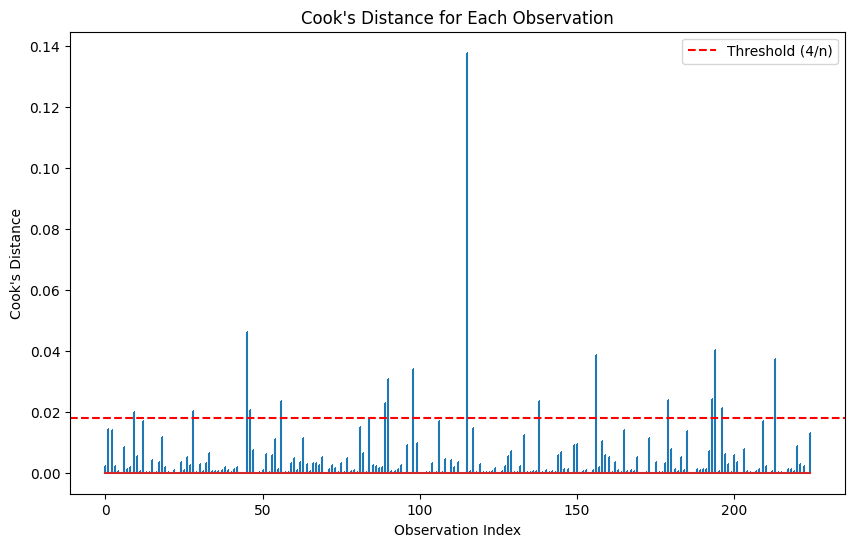

In [ ]:
import statsmodels.api as sm

# Example: Fit a linear regression model using statsmodels
X_train_scaled_dum = sm.add_constant(X_train_scaled)  # Add intercept term
model = sm.OLS(y_train, X_train_scaled_dum).fit()    # Fit the model

# Get influence measures
influence = model.get_influence()
cooks_d, _ = influence.cooks_distance

# Plot Cook's Distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",")
plt.axhline(4 / len(cooks_d), color='red', linestyle='--', label='Threshold (4/n)')
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.title("Cook's Distance for Each Observation")
plt.legend()
plt.show()

In [ ]:
n = len(cooks_d)
threshold = 4 / n
influential_points = np.where(cooks_d > threshold)[0]
print(f"Influential Points: {influential_points}")


Influential Points: [  9  28  45  46  56  84  89  90  98 115 138 156 179 193 194 196 213]


In [ ]:
X_train_scaled_df = pd.DataFrame(X_train_scaled).reset_index(drop=True)
y_train_df = pd.DataFrame(y_train).reset_index(drop=True)

X_train_cleaned =X_train_scaled_df.drop(index=list(influential_points), axis=0)
y_train_cleaned =y_train_df.drop(index=list(influential_points), axis=0)
# Now as we dropped High Influential points, we skipped dealing with dealing multicollienarity problem. Because our goal primarily focuses on prediction.

In [ ]:
model_final=LinearRegression()
model_final.fit(np.array(X_train_cleaned),np.array(y_train_cleaned))

LinearRegression()

In [ ]:
y_pred=model_final.predict(X_test_scaled)
n = len(y_test)
p = X_test_scaled.shape[1]

adj_r2 = adjusted_r2_score(y_test, y_pred, n, p)
print(f"Adjusted R²: {adj_r2:.4f}")
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}')
# After removing high influential points, we find any improvement in R2, and if we remove columns creating trouble  with collinearity, we would be left with 11 columns.

Adjusted R²: 0.4533
RMSE: 5582286.812301206


In [ ]:
X_train_cleaned.columns=X_train_encoded.columns
X_test_scaled_df.columns=X_test_encoded.columns
non_collinear_x_train=X_train_cleaned.drop(["MP", "FG%", "3P", "2P", "eFG%", "FT", "ORB", "TRB", "AST",  "TOV","PTS"],axis=1)
non_collinear_x_test=X_test_scaled_df.drop(["MP", "FG%", "3P", "2P", "eFG%", "FT", "ORB", "TRB", "AST",  "TOV","PTS"],axis=1)

In [ ]:
model_with_no_collinear_columns=LinearRegression()
model_with_no_collinear_columns.fit(np.array(non_collinear_x_train),np.array(y_train_cleaned))
y_pred=model_final.predict(X_test_scaled)
n = len(y_test)
p = X_test_scaled.shape[1]

adj_r2 = adjusted_r2_score(y_test, y_pred, n, p)
print(f"Adjusted R²: {adj_r2:.4f}")
print(f'RMSE: {np.sqrt(mean_squared_error(y_test, y_pred))}')
# It not looking good with removing a huge number of columns, and rows. So we would try non-linear models

Adjusted R²: 0.2720
RMSE: 6441774.756245123


# Tree Based Approach

Loading and preprocessing data...
Training model...
Best parameters: {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 400, 'oob_score': True}

Evaluating model performance...

Model Performance Metrics:
Training R² Score: 0.8556
Testing R² Score: 0.7039
Adjusted R² Score: 0.5596
Training RMSE: $4,381,182.17
Testing RMSE: $6,222,135.76
Cross-validation RMSE: $6,711,681.72


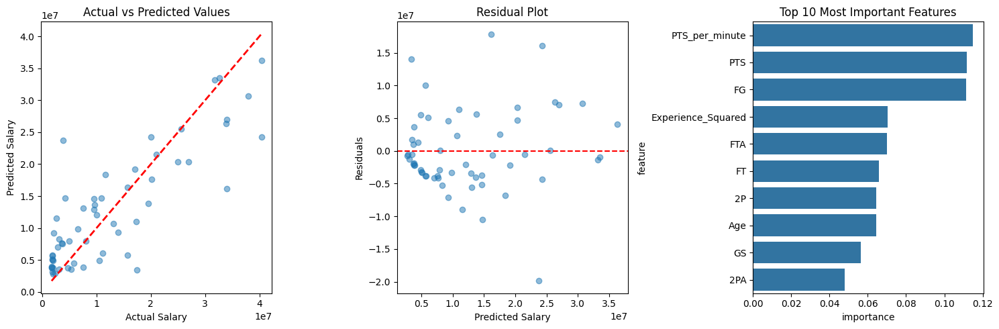

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
import seaborn as sns

class NBAPredictor:
    def __init__(self):
        self.model = None
        self.le_team = LabelEncoder()
        self.le_pos = LabelEncoder()
        self.scaler = StandardScaler()
        self.feature_selector = None

    def handle_outliers(self, df, columns, threshold=1.5):
        df_clean = df.copy()
        for column in columns:
            Q1 = df_clean[column].quantile(0.25)
            Q3 = df_clean[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            df_clean[column] = df_clean[column].clip(lower_bound, upper_bound)
        return df_clean

    def create_features(self, df):
        # Per game statistics
        if 'MP' in df.columns:
            per_minute_cols = ['PTS', 'AST', 'TRB', 'STL', 'BLK']
            for col in per_minute_cols:
                if col in df.columns:
                    df[f'{col}_per_minute'] = df[col] / df['MP']

        # Efficiency metrics
        if all(col in df.columns for col in ['FGA', 'MP', 'PTS', 'FTA']):
            df['Usage_Rate'] = df['FGA'] / df['MP']
            df['Scoring_Efficiency'] = df['PTS'] / (df['FGA'] + 0.44 * df['FTA'])

        # Experience and interaction features
        if 'Age' in df.columns:
            df['Experience_Squared'] = df['Age'] ** 2

        if all(col in df.columns for col in ['AST', 'TOV']):
            df['AST_to_TOV'] = df['AST'] / (df['TOV'] + 1)

        return df

    def load_and_preprocess_data(self, file_path):
        print("Loading and preprocessing data...")
        df = pd.read_csv(file_path)

        # Handle missing values
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        for col in numeric_columns:
            df[col] = df[col].fillna(df[col].median())

        # Handle outliers in key metrics
        outlier_columns = ['Salary', 'PTS', 'AST', 'TRB', 'STL', 'BLK']
        df = self.handle_outliers(df, outlier_columns)

        # Create derived features
        df = self.create_features(df)

        # Encode categorical variables
        if 'Tm' in df.columns:
            df['Tm'] = self.le_team.fit_transform(df['Tm'])
        if 'Pos' in df.columns:
            df['Pos'] = self.le_pos.fit_transform(df['Pos'])

        # Remove non-predictive columns
        if 'Player' in df.columns:
            df = df.drop('Player', axis=1)

        return df

    def select_features(self, X, y):
        base_model = RandomForestRegressor(n_estimators=100, random_state=42)
        selector = SelectFromModel(base_model, prefit=False, threshold='median')
        selector.fit(X, y)
        self.feature_selector = selector
        return X.loc[:, selector.get_support()]

    def train_model(self, X, y):
        print("Training model...")
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        # Feature selection
        X_train = self.select_features(X_train, y_train)
        X_test = X_test[X_train.columns]

        # Grid search parameters
        param_grid = {
            'n_estimators': [200, 300, 400],
            'max_depth': [8, 10, 12],
            'min_samples_split': [5, 8, 10],
            'min_samples_leaf': [4, 6, 8],
            'max_features': ['sqrt', 'log2'],
            'bootstrap': [True],
            'oob_score': [True]
        }

        # Initialize and train model with grid search
        rf = RandomForestRegressor(random_state=42)
        grid_search = GridSearchCV(
            estimator=rf,
            param_grid=param_grid,
            cv=5,
            n_jobs=-1,
            scoring='neg_mean_squared_error'
        )

        grid_search.fit(X_train, y_train)
        self.model = grid_search.best_estimator_
        print("Best parameters:", grid_search.best_params_)

        return X_train, X_test, y_train, y_test

    def evaluate_model(self, X_train, X_test, y_train, y_test):
        print("\nEvaluating model performance...")

        # Get predictions
        y_train_pred = self.model.predict(X_train)
        y_test_pred = self.model.predict(X_test)

        # Calculate metrics
        train_r2 = r2_score(y_train, y_train_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

        # Calculate Adjusted R²
        n = X_test.shape[0]
        p = X_test.shape[1]
        adj_r2 = 1 - (1 - test_r2) * (n - 1) / (n - p - 1)

        # K-fold cross-validation
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        cv_scores = []

        for train_idx, val_idx in kf.split(X_train):
            X_train_cv, X_val_cv = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_train_cv, y_val_cv = y_train.iloc[train_idx], y_train.iloc[val_idx]

            self.model.fit(X_train_cv, y_train_cv)
            pred_cv = self.model.predict(X_val_cv)
            cv_scores.append(np.sqrt(mean_squared_error(y_val_cv, pred_cv)))

        cv_rmse = np.mean(cv_scores)

        # Print metrics
        print("\nModel Performance Metrics:")
        print(f"Training R² Score: {train_r2:.4f}")
        print(f"Testing R² Score: {test_r2:.4f}")
        print(f"Adjusted R² Score: {adj_r2:.4f}")
        print(f"Training RMSE: ${train_rmse:,.2f}")
        print(f"Testing RMSE: ${test_rmse:,.2f}")
        print(f"Cross-validation RMSE: ${cv_rmse:,.2f}")

        return y_test_pred

    def plot_results(self, X_train, X_test, y_test, y_pred):
        plt.figure(figsize=(15, 5))

        # Actual vs Predicted
        plt.subplot(1, 3, 1)
        plt.scatter(y_test, y_pred, alpha=0.5)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        plt.xlabel('Actual Salary')
        plt.ylabel('Predicted Salary')
        plt.title('Actual vs Predicted Values')

        # Residuals
        errors = y_test - y_pred
        plt.subplot(1, 3, 2)
        plt.scatter(y_pred, errors, alpha=0.5)
        plt.xlabel('Predicted Salary')
        plt.ylabel('Residuals')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Residual Plot')

        # Feature importance
        feature_importance = pd.DataFrame({
            'feature': X_train.columns,
            'importance': self.model.feature_importances_
        }).sort_values('importance', ascending=False)

        plt.subplot(1, 3, 3)
        sns.barplot(x='importance', y='feature', data=feature_importance.head(10))
        plt.title('Top 10 Most Important Features')

        plt.tight_layout()
        plt.show()

def main():
    predictor = NBAPredictor()

    # Load and preprocess data
    df = predictor.load_and_preprocess_data("AR_dataset_v1.csv")

    # Separate features and target
    X = df.drop('Salary', axis=1)
    y = df['Salary']

    # Train model
    X_train, X_test, y_train, y_test = predictor.train_model(X, y)

    # Evaluate model
    y_pred = predictor.evaluate_model(X_train, X_test, y_train, y_test)

    # Plot results
    predictor.plot_results(X_train, X_test, y_test, y_pred)

if __name__ == "__main__":
    main()
